In [ ]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
use_colab = None

In [ ]:
!pip install fastai --upgrade

In [ ]:
!wget https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
!unzip -q celeba.zip

--2021-12-04 05:43:24--  https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.112.8
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.112.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1443490838 (1.3G) [application/zip]
Saving to: ‘celeba.zip’

celeba.zip           10%[=>                  ] 141.32M  21.0MB/s    eta 69s    ^C
[celeba.zip]
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of celeba.zip or
        celeba.zip.zip, and cannot find celeba.zip.ZIP, period.


In [ ]:
use_colab = False
if use_colab == True:
    path = coco_path
else:
    path = "/content/img_align_celeba"
    
paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names
np.random.seed(123)
paths_subset = np.random.choice(paths, 10_000, replace=False) # choosing 1000 images randomly
rand_idxs = np.random.permutation(10_000)
train_idxs = rand_idxs[:8000] # choosing the first 8000 as training set
val_idxs = rand_idxs[8000:] # choosing last 2000 as validation set
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
print(len(train_paths), len(val_paths))

8000 2000


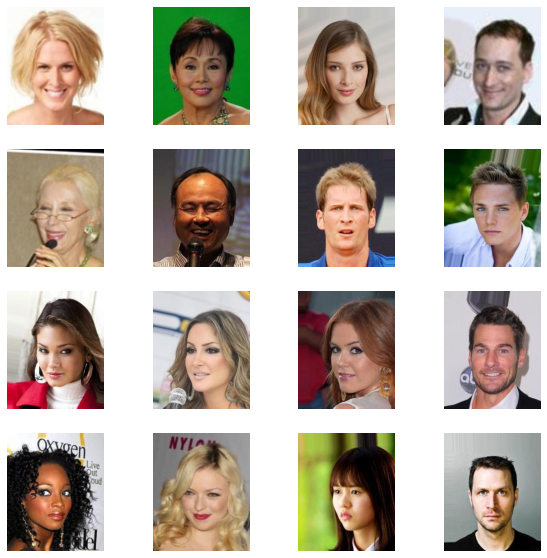

In [ ]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

In [ ]:
SIZE = 400
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)
        
        self.split = split
        self.size = SIZE
        self.paths = paths
    
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1
        
        return {'L': L, 'ab': ab}
    
    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

In [ ]:
train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')

data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


torch.Size([16, 1, 400, 400]) torch.Size([16, 2, 400, 400])
500 125


In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [ ]:
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 512, 512) # batch_size, channels, size, size
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 62, 62])

In [ ]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [ ]:
def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [ ]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [ ]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

In [ ]:
def train_model(model, train_dl, epochs, display_every=200):
    data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=False) # function displaying the model's outputs
        torch.save(model.state_dict(), f"final_model_{e}_new.pt")

In [ ]:
from fastai.vision.learner import create_body
from torchvision.models.resnet import resnet18
from fastai.vision.models.unet import DynamicUnet

In [ ]:
def build_res_unet(n_input=1, n_output=2, size=256):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    body = create_body(resnet18, pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G

In [ ]:
# def pretrain_generator(net_G, train_dl, opt, criterion, epochs):
#     best_loss = np.inf
#     for e in range(epochs):
#         loss_meter = AverageMeter()
#         for data in tqdm(train_dl):
#             L, ab = data['L'].to(device), data['ab'].to(device)
#             preds = net_G(L)
#             loss = criterion(preds, ab)
#             opt.zero_grad()
#             loss.backward()
#             opt.step()
            
#             loss_meter.update(loss.item(), L.size(0))
        
#         print(f"Epoch {e + 1}/{epochs}")
#         print(f"L1 Loss: {loss_meter.avg:.5f}")
#         if loss_meter.avg < best_loss:
#             torch.save(net_G.state_dict(), f"res18-unet_{e}.pt")
#             best_loss = loss_meter.avg


# net_G = build_res_unet(n_input=1, n_output=2, size=256)
# opt = optim.Adam(net_G.parameters(), lr=1e-4)
# criterion = nn.L1Loss()        
# pretrain_generator(net_G, train_dl, opt, criterion, 15)
# torch.save(net_G.state_dict(), "res18-unet.pt")

model initialized with norm initialization


  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 1/15
Iteration 200/500
loss_D_fake: 0.61944
loss_D_real: 0.62721
loss_D: 0.62333
loss_G_GAN: 1.04058
loss_G_L1: 6.41507
loss_G: 7.45565


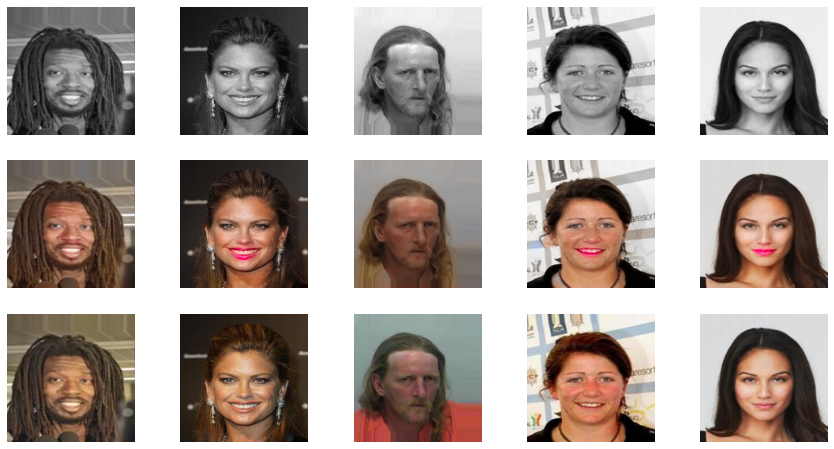


Epoch 1/15
Iteration 400/500
loss_D_fake: 0.58821
loss_D_real: 0.59899
loss_D: 0.59360
loss_G_GAN: 1.12835
loss_G_L1: 6.49653
loss_G: 7.62488


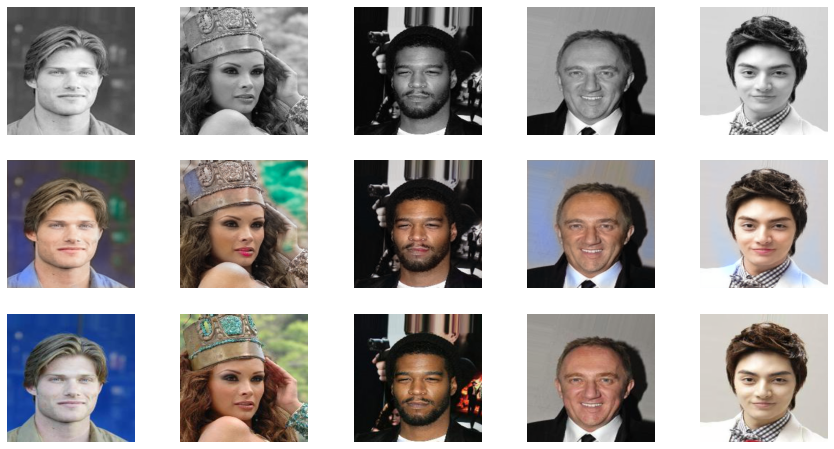

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 2/15
Iteration 200/500
loss_D_fake: 0.57552
loss_D_real: 0.59297
loss_D: 0.58425
loss_G_GAN: 1.14608
loss_G_L1: 6.67598
loss_G: 7.82206


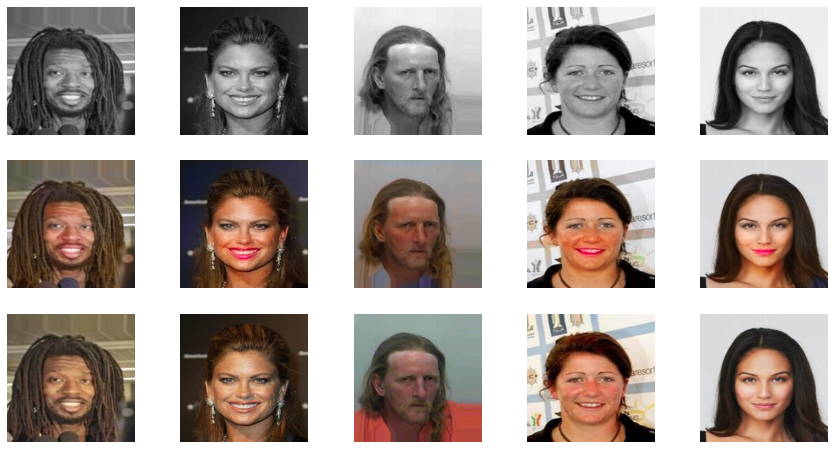


Epoch 2/15
Iteration 400/500
loss_D_fake: 0.56944
loss_D_real: 0.59483
loss_D: 0.58213
loss_G_GAN: 1.15369
loss_G_L1: 6.70084
loss_G: 7.85453


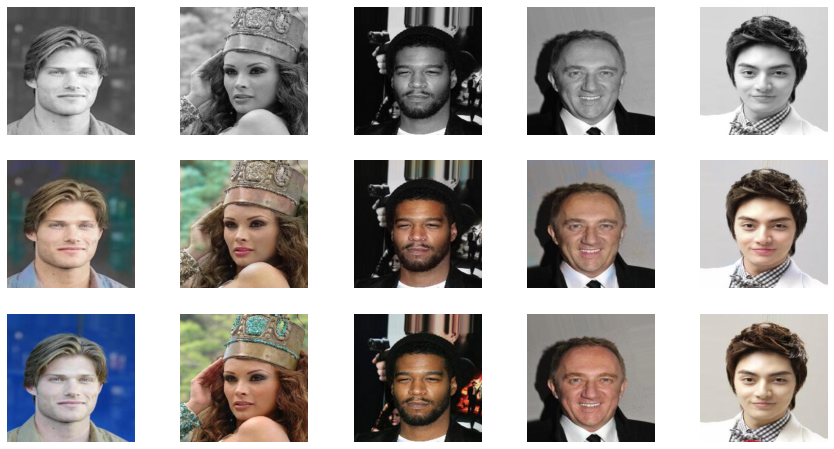

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 3/15
Iteration 200/500
loss_D_fake: 0.59150
loss_D_real: 0.62423
loss_D: 0.60786
loss_G_GAN: 1.04056
loss_G_L1: 6.63899
loss_G: 7.67955


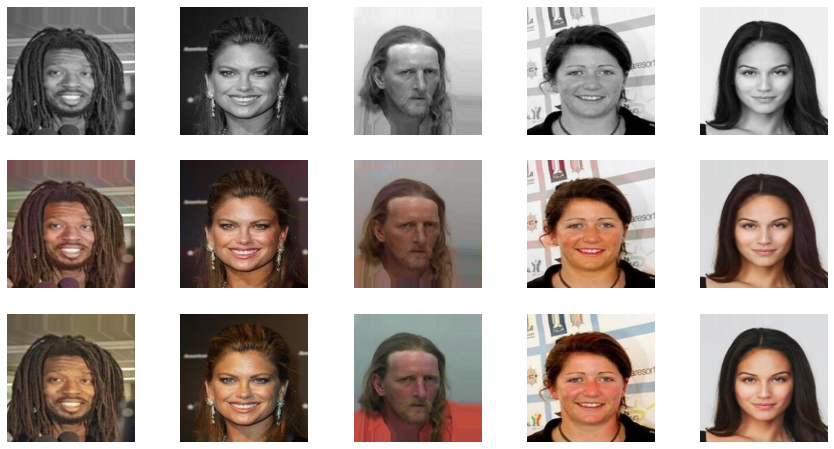


Epoch 3/15
Iteration 400/500
loss_D_fake: 0.58923
loss_D_real: 0.62166
loss_D: 0.60545
loss_G_GAN: 1.07036
loss_G_L1: 6.68461
loss_G: 7.75497


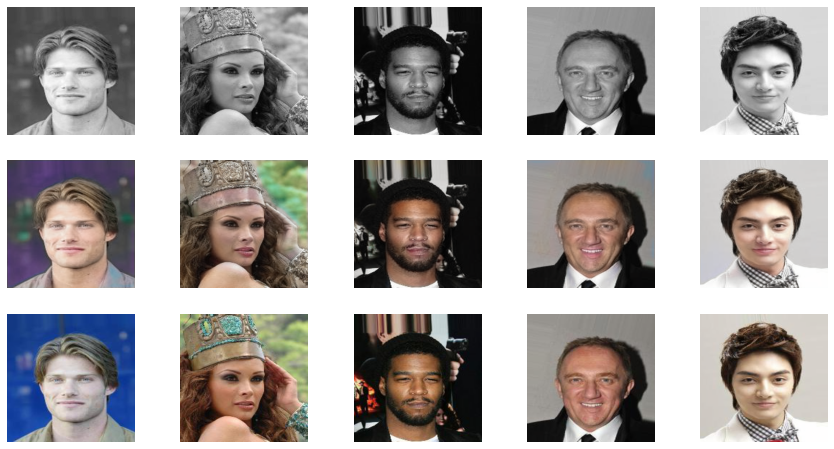

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 4/15
Iteration 200/500
loss_D_fake: 0.59362
loss_D_real: 0.62720
loss_D: 0.61041
loss_G_GAN: 1.01980
loss_G_L1: 6.58089
loss_G: 7.60069


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 356 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


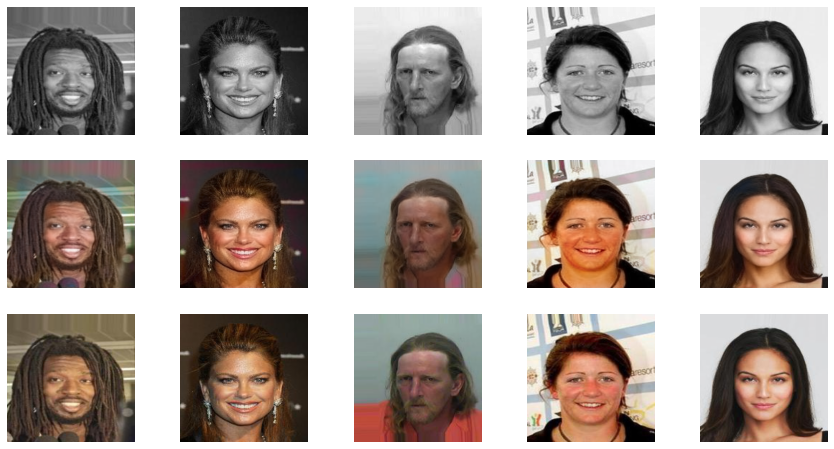


Epoch 4/15
Iteration 400/500
loss_D_fake: 0.59266
loss_D_real: 0.63122
loss_D: 0.61194
loss_G_GAN: 1.02728
loss_G_L1: 6.62161
loss_G: 7.64889


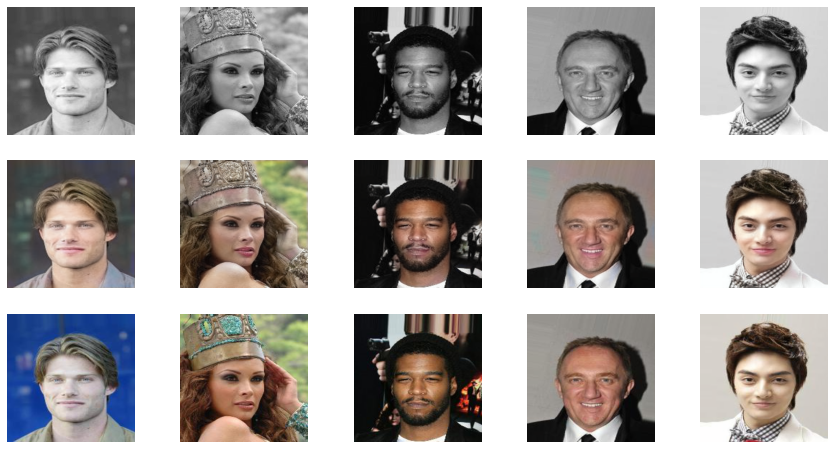

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 5/15
Iteration 200/500
loss_D_fake: 0.60121
loss_D_real: 0.63783
loss_D: 0.61952
loss_G_GAN: 0.99660
loss_G_L1: 6.47634
loss_G: 7.47293


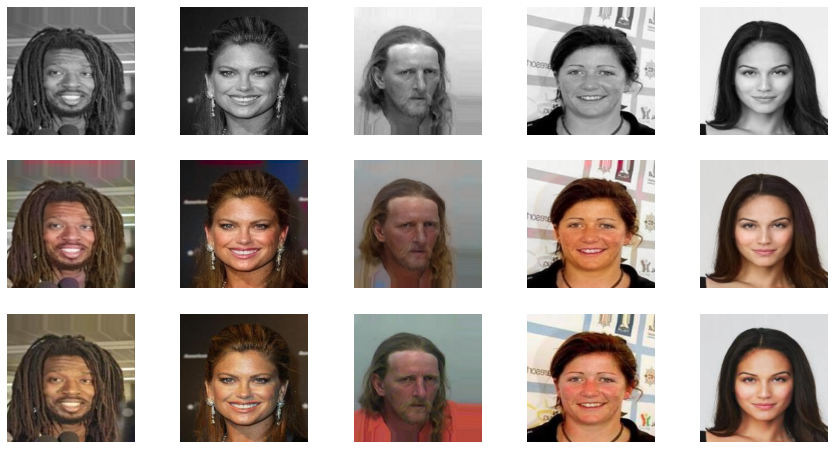


Epoch 5/15
Iteration 400/500
loss_D_fake: 0.59949
loss_D_real: 0.63818
loss_D: 0.61884
loss_G_GAN: 0.99724
loss_G_L1: 6.50995
loss_G: 7.50718


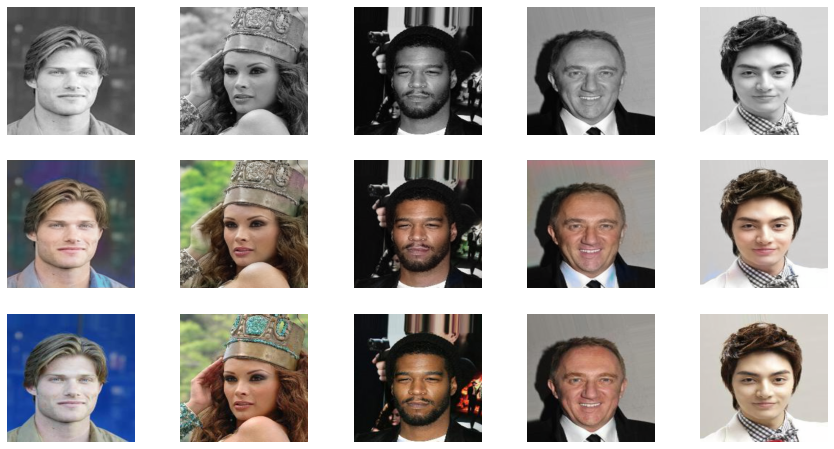

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 6/15
Iteration 200/500
loss_D_fake: 0.59700
loss_D_real: 0.64103
loss_D: 0.61901
loss_G_GAN: 0.98280
loss_G_L1: 6.42176
loss_G: 7.40456


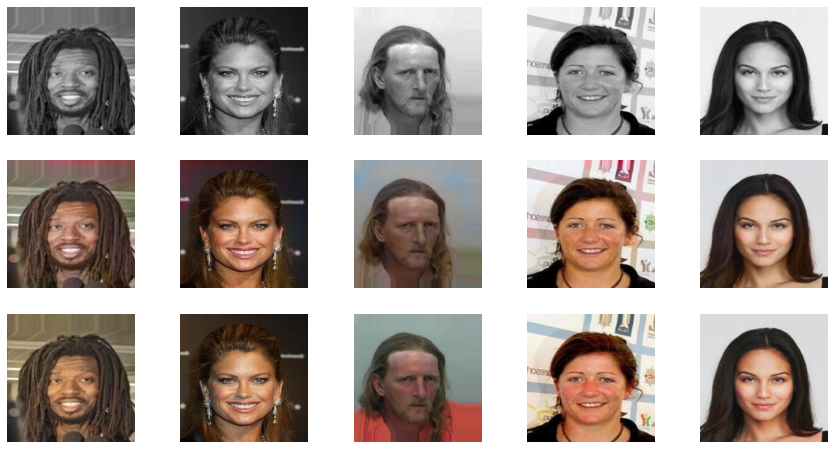


Epoch 6/15
Iteration 400/500
loss_D_fake: 0.59907
loss_D_real: 0.64027
loss_D: 0.61967
loss_G_GAN: 1.00774
loss_G_L1: 6.42314
loss_G: 7.43088


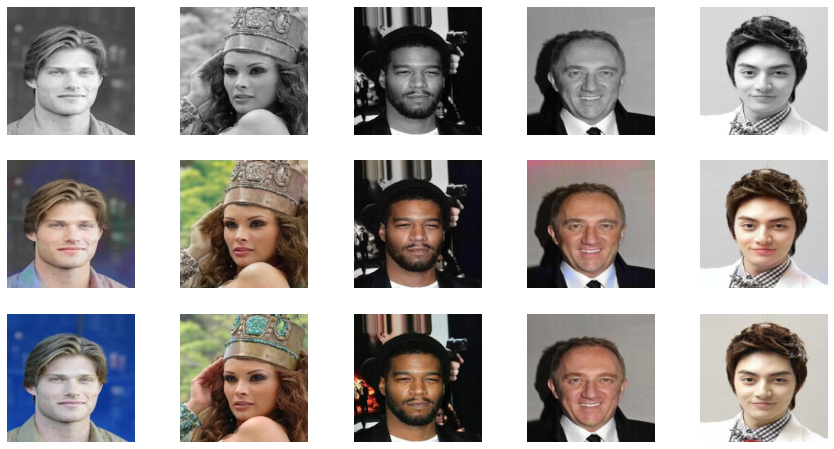

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 7/15
Iteration 200/500
loss_D_fake: 0.60379
loss_D_real: 0.64110
loss_D: 0.62245
loss_G_GAN: 0.96832
loss_G_L1: 6.29087
loss_G: 7.25919


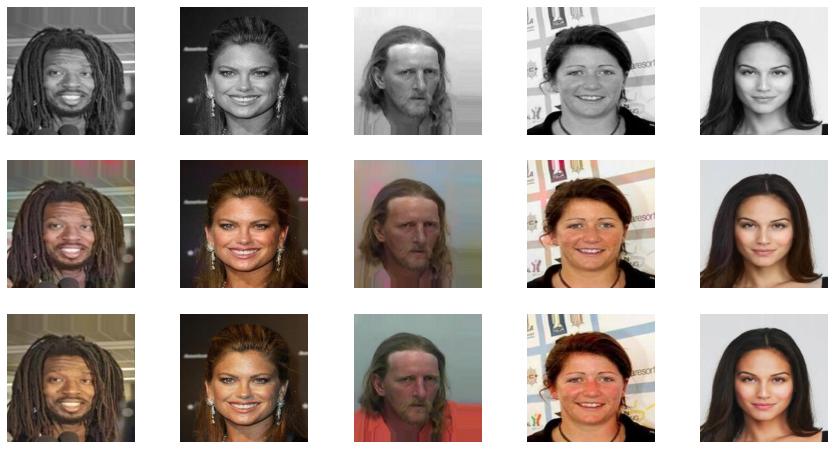


Epoch 7/15
Iteration 400/500
loss_D_fake: 0.60422
loss_D_real: 0.64169
loss_D: 0.62296
loss_G_GAN: 0.97592
loss_G_L1: 6.31102
loss_G: 7.28694


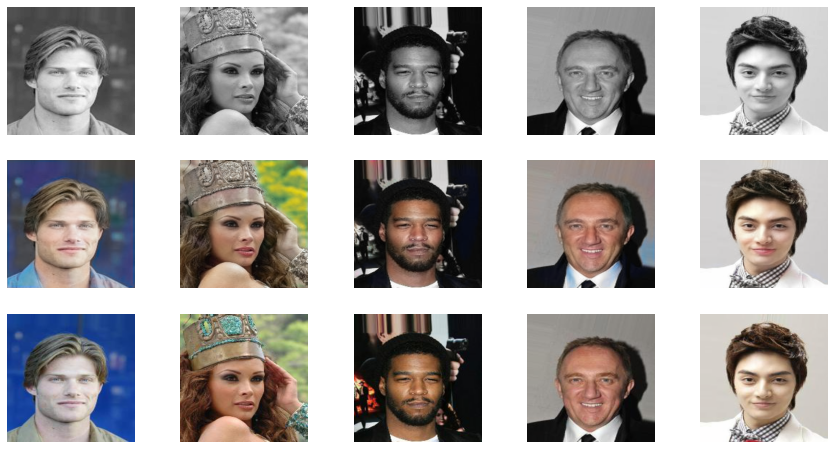

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 8/15
Iteration 200/500
loss_D_fake: 0.60222
loss_D_real: 0.64401
loss_D: 0.62311
loss_G_GAN: 0.96717
loss_G_L1: 6.17575
loss_G: 7.14292


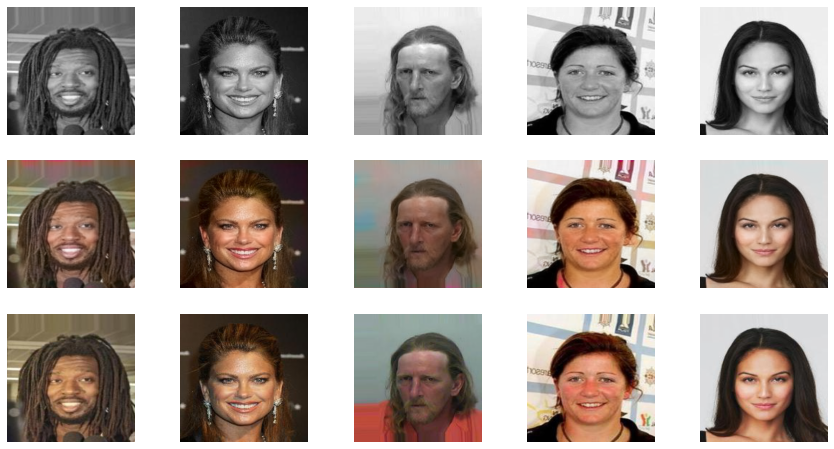


Epoch 8/15
Iteration 400/500
loss_D_fake: 0.60793
loss_D_real: 0.64794
loss_D: 0.62794
loss_G_GAN: 0.96283
loss_G_L1: 6.15898
loss_G: 7.12181


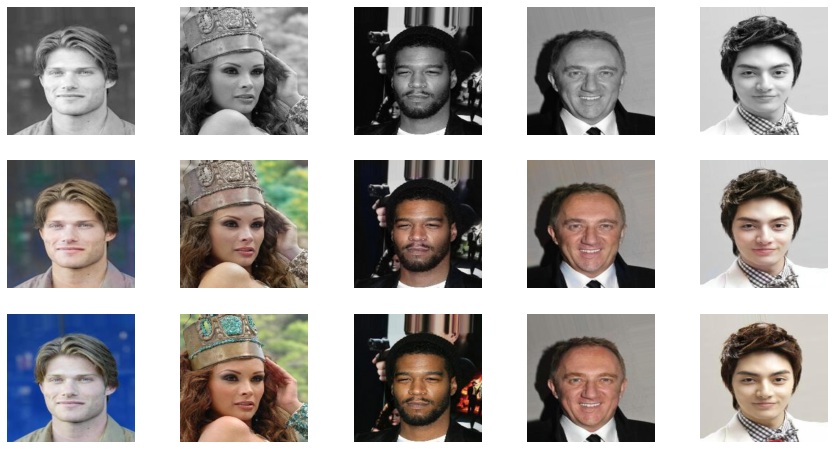

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 9/15
Iteration 200/500
loss_D_fake: 0.60666
loss_D_real: 0.64630
loss_D: 0.62648
loss_G_GAN: 0.94235
loss_G_L1: 6.00585
loss_G: 6.94820


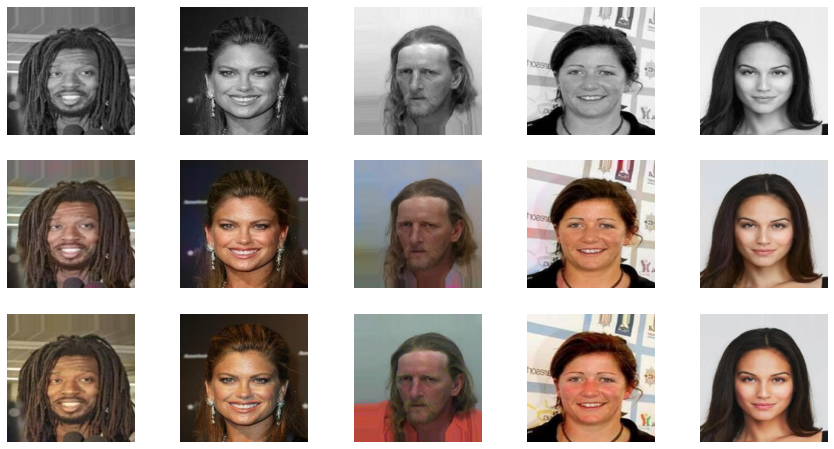


Epoch 9/15
Iteration 400/500
loss_D_fake: 0.61288
loss_D_real: 0.64969
loss_D: 0.63129
loss_G_GAN: 0.94426
loss_G_L1: 6.00650
loss_G: 6.95076


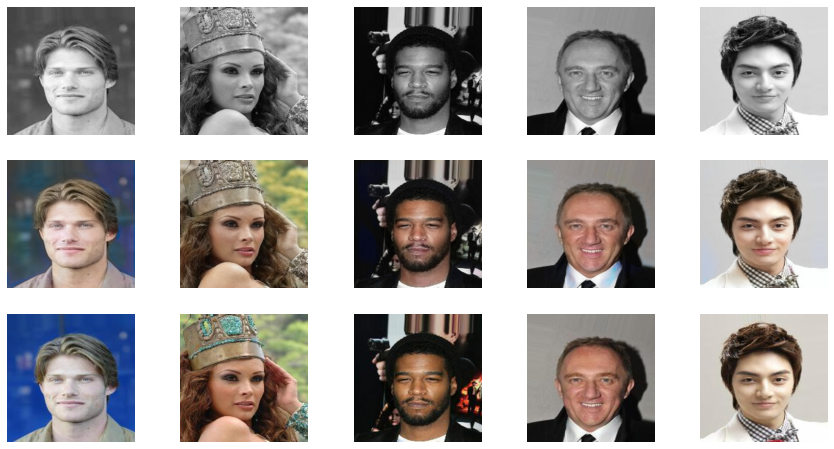

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 10/15
Iteration 200/500
loss_D_fake: 0.61064
loss_D_real: 0.64174
loss_D: 0.62619
loss_G_GAN: 0.94675
loss_G_L1: 5.90467
loss_G: 6.85142


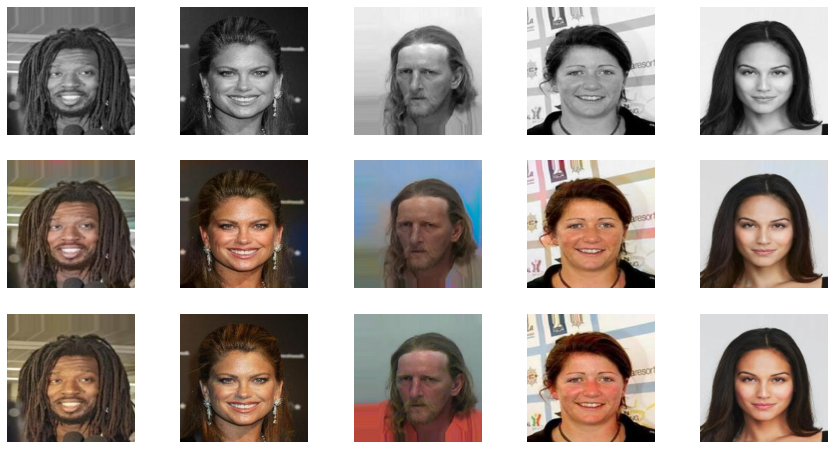


Epoch 10/15
Iteration 400/500
loss_D_fake: 0.61877
loss_D_real: 0.64449
loss_D: 0.63163
loss_G_GAN: 0.93754
loss_G_L1: 5.87203
loss_G: 6.80957


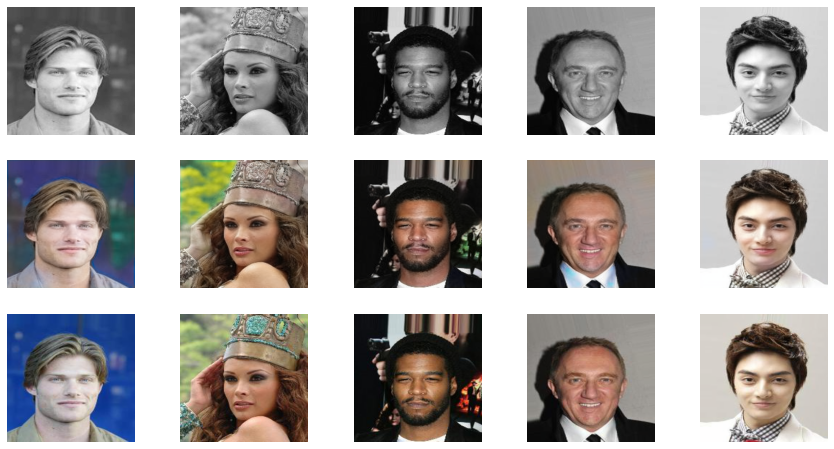

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 11/15
Iteration 200/500
loss_D_fake: 0.61103
loss_D_real: 0.64815
loss_D: 0.62959
loss_G_GAN: 0.92480
loss_G_L1: 5.75566
loss_G: 6.68045


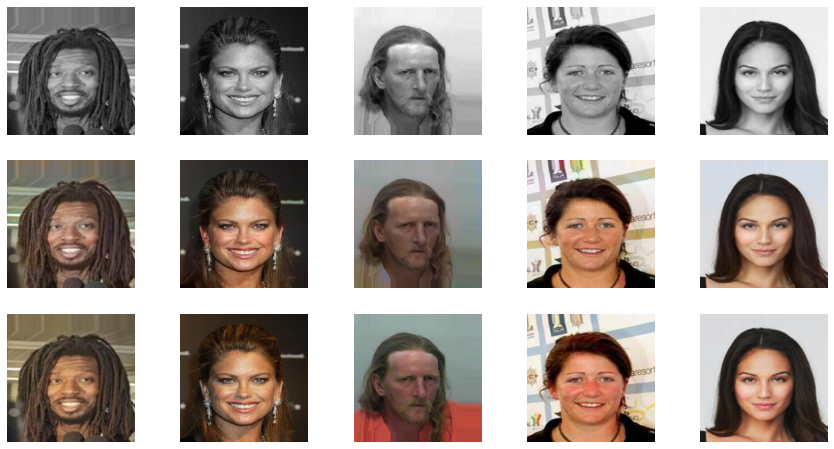


Epoch 11/15
Iteration 400/500
loss_D_fake: 0.61857
loss_D_real: 0.65080
loss_D: 0.63469
loss_G_GAN: 0.92617
loss_G_L1: 5.72308
loss_G: 6.64926


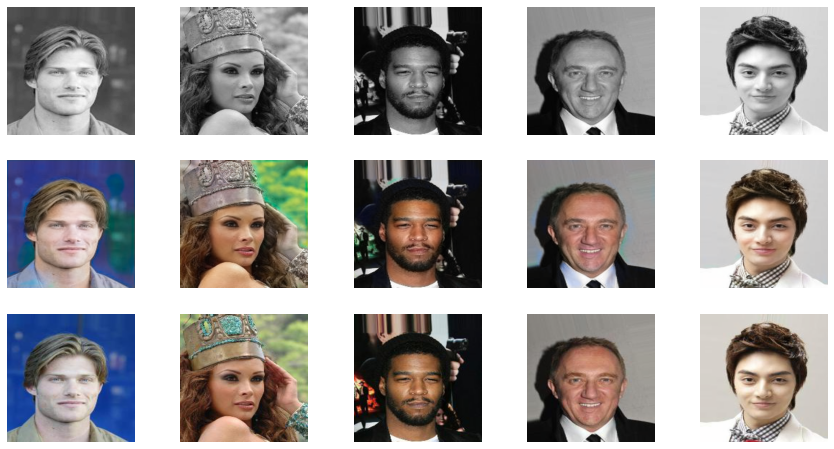

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 12/15
Iteration 200/500
loss_D_fake: 0.61531
loss_D_real: 0.64706
loss_D: 0.63119
loss_G_GAN: 0.91849
loss_G_L1: 5.63017
loss_G: 6.54867


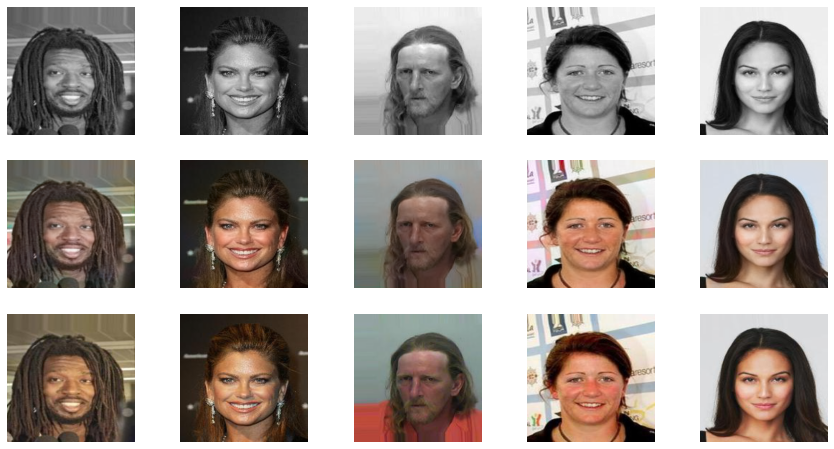


Epoch 12/15
Iteration 400/500
loss_D_fake: 0.62373
loss_D_real: 0.64995
loss_D: 0.63684
loss_G_GAN: 0.91770
loss_G_L1: 5.60220
loss_G: 6.51990


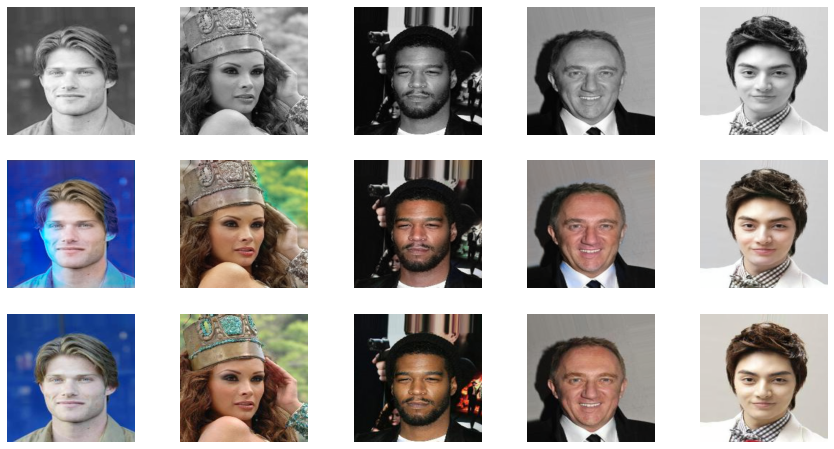

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 13/15
Iteration 200/500
loss_D_fake: 0.61548
loss_D_real: 0.64929
loss_D: 0.63238
loss_G_GAN: 0.90447
loss_G_L1: 5.50287
loss_G: 6.40735


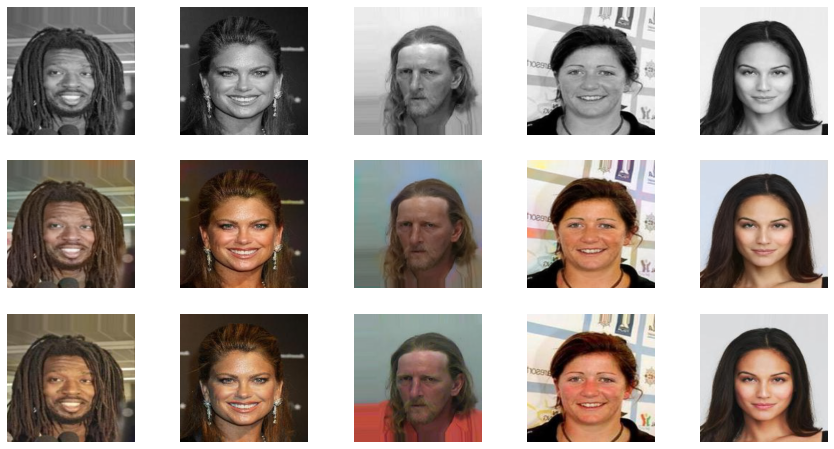


Epoch 13/15
Iteration 400/500
loss_D_fake: 0.62606
loss_D_real: 0.65175
loss_D: 0.63891
loss_G_GAN: 0.90617
loss_G_L1: 5.43996
loss_G: 6.34613


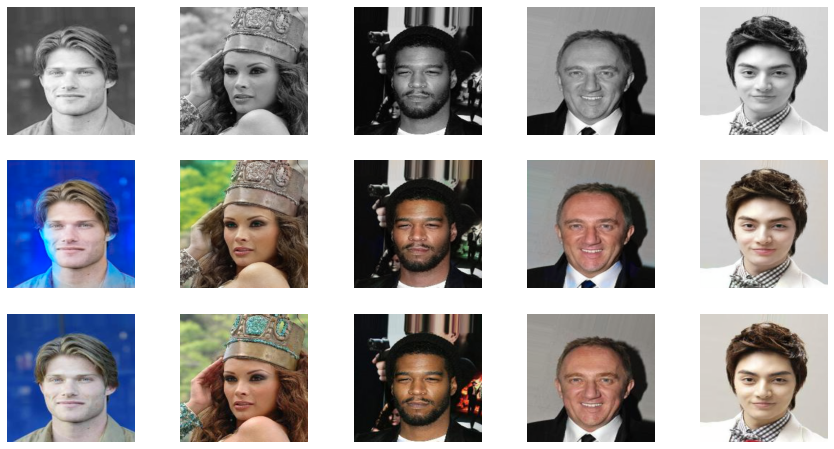

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 14/15
Iteration 200/500
loss_D_fake: 0.62544
loss_D_real: 0.64970
loss_D: 0.63757
loss_G_GAN: 0.89864
loss_G_L1: 5.29741
loss_G: 6.19605


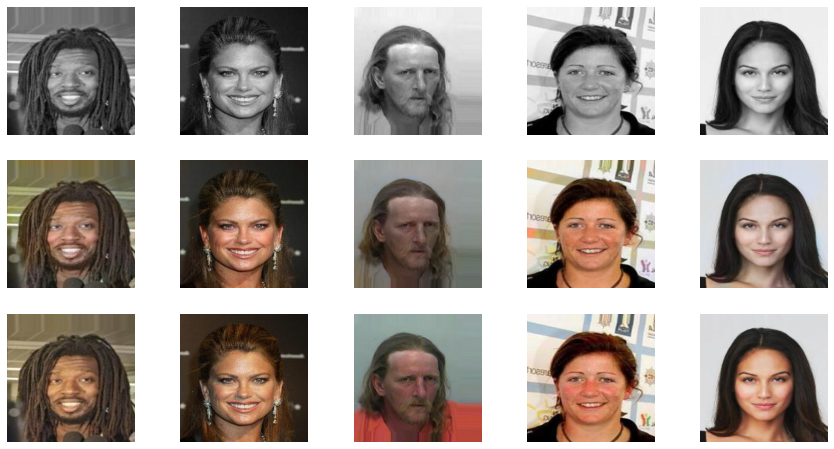


Epoch 14/15
Iteration 400/500
loss_D_fake: 0.63064
loss_D_real: 0.65153
loss_D: 0.64109
loss_G_GAN: 0.89635
loss_G_L1: 5.27170
loss_G: 6.16804


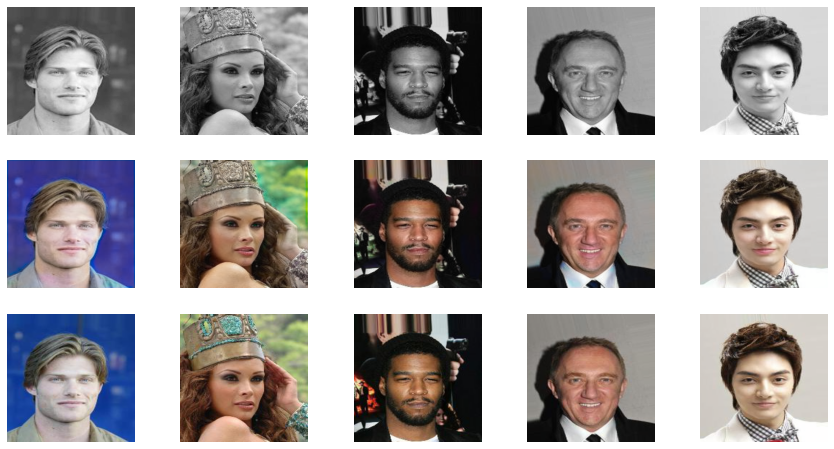

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 15/15
Iteration 200/500
loss_D_fake: 0.63233
loss_D_real: 0.65135
loss_D: 0.64184
loss_G_GAN: 0.89369
loss_G_L1: 5.16095
loss_G: 6.05464


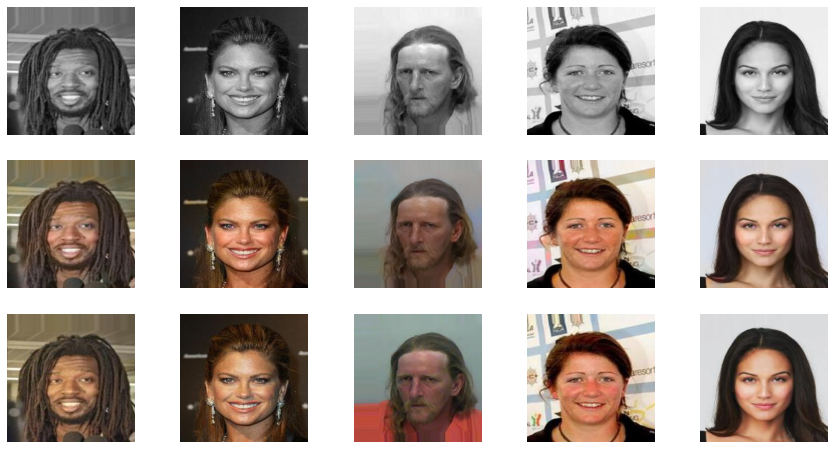


Epoch 15/15
Iteration 400/500
loss_D_fake: 0.63966
loss_D_real: 0.65165
loss_D: 0.64565
loss_G_GAN: 0.89030
loss_G_L1: 5.12127
loss_G: 6.01157


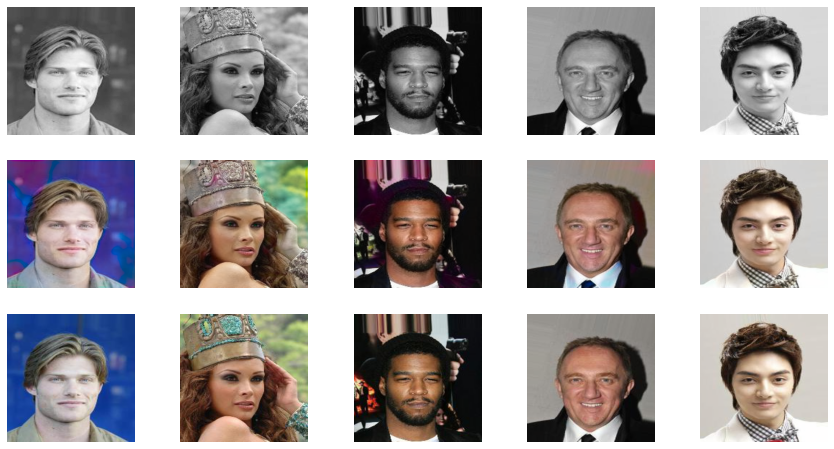

In [ ]:
net_G = build_res_unet(n_input=1, n_output=2, size=400)
net_G.load_state_dict(torch.load("/content/drive/MyDrive/res18-unet.pt", map_location=device))
model = MainModel(net_G=net_G)
train_model(model, train_dl, 15)

In [ ]:
# net_G = build_res_unet(n_input=1, n_output=2, size=256)
# net_G.load_state_dict(torch.load("res18-unet.pt", map_location=device))
# model = MainModel(net_G=net_G)
# model.load_state_dict(torch.load("final_model_weights.pt", map_location=device))

In [ ]:
print("Hello")

Hello


In [ ]:
print("DONEEE")

DONEEE
